# Used libraries

In [1]:
import Pkg;
Pkg.add("Plots")
Pkg.add("Printf")
Pkg.add("Random")
Pkg.add("Distributions")
Pkg.add("DataStructures")

  Updating registry at `~/.julia/registries/General`
  Updating git-repo `https://github.com/JuliaRegistries/General.git`
Fetching: [========================================>]  100.0 %.0 % Resolving package versions...
  Updating `~/.julia/environments/v1.0/Project.toml`
 [no changes]
  Updating `~/.julia/environments/v1.0/Manifest.toml`
 [no changes]
 Resolving package versions...
  Updating `~/.julia/environments/v1.0/Project.toml`
 [no changes]
  Updating `~/.julia/environments/v1.0/Manifest.toml`
 [no changes]
 Resolving package versions...
  Updating `~/.julia/environments/v1.0/Project.toml`
 [no changes]
  Updating `~/.julia/environments/v1.0/Manifest.toml`
 [no changes]
 Resolving package versions...
  Updating `~/.julia/environments/v1.0/Project.toml`
 [no changes]
  Updating `~/.julia/environments/v1.0/Manifest.toml`
 [no changes]
 Resolving package versions...
  Updating `~/.julia/environments/v1.0/Project.toml`
 [no changes]
  Updating `~/.julia/environments/v1.0/Manifest.to

In [2]:
using Plots;
using Printf;
using Random;
using Distributions;
using DataStructures;

# Functions

## Ackley

In [3]:
function Ackley(x; a=20, b=0.2, c=2*pi) 
    d = length(x)
    sumSquares = sum(x.^2)
    sumCos = sum(cos.(c*x))
    y = -a*exp(-b*sqrt(sumSquares/d)) - exp(sumCos/d) + a + exp(1)
    return y
end;

Ackley_2D(x1,x2) = Ackley([x1,x2]);

## Six Hump Camel

In [4]:
function SixHump_2D(x1, x2)
    y = (4-2.1*x1^2 + (x1^4)/3)*(x1^2) + (x1*x2) + (-4+4*(x2^2))*(x2^2)
    return y
end;

function SixHump(x)
    return SixHump_2D(x[1], x[2])
end;

## Easom

In [5]:
function Easom_2D(x1, x2)
    y = -cos(x1)*cos(x2)*exp(-(x1-pi)^2-(x2-pi)^2)
    return y
end;

function Easom(x)
    return Easom_2D(x[1], x[2])
end;

# Plots

## Ackley

In [6]:
x1 = collect(-20:0.1:40)
x2 = collect(-20:0.1:40)

c = contour(x1, x2, Ackley_2D, fill=true)
plot(c)

## Six Hump Camel

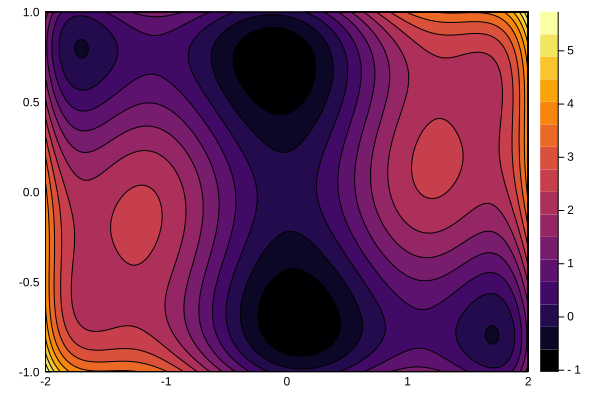

In [7]:
x1 = collect(-2:0.01:2)
x2 = collect(-1:0.01:1)

c = contour(x1, x2, SixHump_2D, fill=true)
plot(c)


## Easom

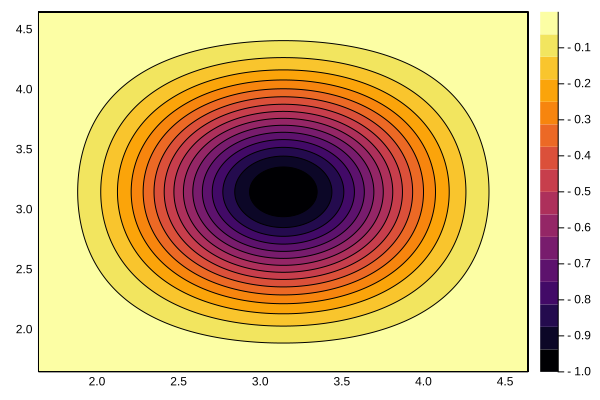

In [8]:
x1 = pi .+ collect(-1.5:0.01:1.5)
x2 = pi .+ collect(-1.5:0.01:1.5)

c = contour(x1, x2, Easom_2D, fill=true)
plot(c)

# Algorithms

## Simulated annealing

In [9]:
using DataStructures

struct HyperRectangle
    a # vector, lower-left corner of hyper rectangle in 2D
    b # vector, upper-right corner of hyper rectangle in 2D
        # a and b be must be vectors of same dimension d, and it must be a[i] <= b[i] for i in 1:d
end;

# L1-norm ball
mutable struct L1NormBall
    center # vector, center of L1-norm sphere
    radius # vector, radius in each dimension
        # center and radius must be vectors of same dimension d, and it must be radius[i] >= 0 for i in i:d
end;

# find function f minimum in HyperRectangle searchRect
function SimulatedAnnealing(f, searchRect::HyperRectangle; 
        iterCount=1e3, zeroTemperature=1.0/iterCount, eps=1.0/iterCount, DEBUG=false) 
            # iterCount - number of simulated annealing iterations, 
            # zeroTemperature - temperature at last iteration (must be from interval (0,1))
            # eps - order of shrinkage of searchRect (must be from interval (0,1))
    
    # calculated simulater annealing parameters
    multT = exp(log(zeroTemperature)/iterCount) # temperature decrease factor multT < 1.0
        # multT is found from the equation multT^iterCount = zeroTemperature
    if (DEBUG)
        @printf("temperature decrease factor: %.5f\n", multT)
    end
    multR = exp(log(eps)/iterCount) # the radius change (increase/decrease) factor
        # multR is found from the equation multR^iterCount = eps
    if (DEBUG)
        @printf("hyper-rectangle decrease factor: %.5f\n", multR)
    end
    
    T = multT # in the beginning, temperature T is close to 1;
        # after iterCount steps, T should be approximately equal to eps
    var = 0.0 # a variable to track the variance of function in sampleBall
    eps = 1e-6 # small number > 0
    
    dim = length(searchRect.a)
    x_iter = searchRect.a .+ (searchRect.b.-searchRect.a) .* rand(dim) # uniformly random point in searchRect
    y_iter = f(x_iter)
    x_best, y_best = x_iter, y_iter
    y_current = y_iter
    
    sampleBall = L1NormBall(x_iter, searchRect.b .- searchRect.a)
        # the next random point will be randomly sampled in intersection(searchRect, sampleBall) hyper-rectangle
    
    diff = abs.(x_iter .- sampleBall.center)
        # diff is the current difference between best found point and sampleBall center (actually, vector or 0's)
    
    x1_stack = Stack{Float64}()
    push!(x1_stack, x_iter[1])
    x2_stack = Stack{Float64}()
    push!(x2_stack, x_iter[2])
    
    ball_stack = Stack{L1NormBall}()
    push!(ball_stack, sampleBall)
    
    for i in 2:iterCount
        T = T * multT # decrease temperature
        a = max.(searchRect.a, sampleBall.center .- sampleBall.radius)
        b = min.(searchRect.b, sampleBall.center .+ sampleBall.radius)
            # hyper-rectangle, specified by a and b, define the intersection os searchRect and sampleBall
        x_iter = a .+ ((b.-a) .* rand(dim)) # uniform sampling in intersection of searchRect and sampleBall        
        y_iter = f(x_iter)
        var = 1.0/i * ((i-1)*var + (y_iter-y_best)^2) # rough variance update
        delta = (y_current - y_iter) / sqrt(var+eps)         
        r = rand()
        prob = min(1.0, exp(delta/T))
        
        if (r < min(1.0,prob))
            # simulated annealing jumps to other point
            sampleBall.center, y_current = x_iter, y_iter
            if (y_iter < y_best)
                x_best, y_best = x_iter, y_iter
            end
            # track how far sampleBall.center is from best found point
            diff = abs.(x_best .- sampleBall.center)
        end 
        
        # depending on how far the current point is from the best point, increase/decrease the radius of ball
        sampleBall.radius = (multR .* sampleBall.radius) .+ ((1-multR) .* diff)
        
        push!(x1_stack, x_iter[1])
        push!(x2_stack, x_iter[2])
        push!(ball_stack, sampleBall)
    end
    if (DEBUG)
        @printf("minimal function value found at: %s; minimal value: %.5f\n", x_best, y_best)
    end
    return x_best, x1_stack, x2_stack, ball_stack
end;

In [10]:
function PlotSimulatedAnnealing(f, f_2D, searchRect, iterCount) 
    
    x_opt, x1_stack, x2_stack, ball_stack = SimulatedAnnealing(f, searchRect; 
        iterCount=iterCount, DEBUG=true);
    # last search L1-norm ball
    last_ball = first(ball_stack)
    @printf("Last search ball: center at %s, radius in each dimension%s\n", last_ball.center, last_ball.radius)

    x1 = collect(searchRect.a[1]:0.2:searchRect.b[1])
    x2 = collect(searchRect.a[2]:0.2:searchRect.b[2])
    c = contour(x1, x2, f_2D, fill=true)

    x1 = [x for x in x1_stack]
    x2 = [x for x in x2_stack]
    scatter!(c, x1, x2, label="iterate points")

    plot(c)
end

Random.seed!(1)
PlotSimulatedAnnealing(Ackley, Ackley_2D, HyperRectangle([-20, -20], [40, 40]), 200)

temperature decrease factor: 0.97386
hyper-rectangle decrease factor: 0.97386
minimal function value found at: [0.0862253, -0.132991]; minimal value: 1.01526
Last search ball: center at [0.0862253, -0.132991], radius in each dimension[0.681107, 0.769652]


In the plot above you can see simulated annealing algorithm sampling while optimizing 2D-Ackley function

### Statistical performance

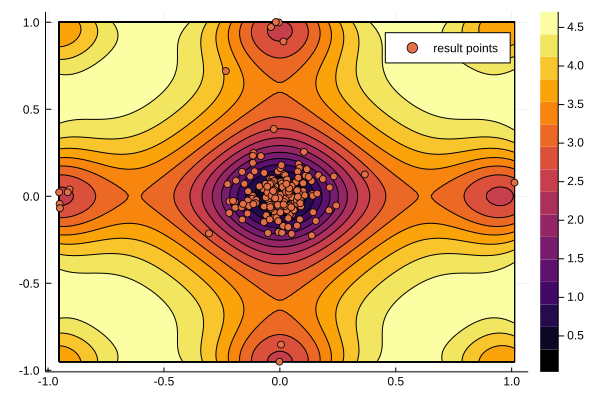

In [11]:
function TestSimulatedAnnealing(simCount, f, f_2D, searchRect, iterCount)
    opt_stack = Stack{L1NormBall}()
    for i in 1:simCount
        x_opt, x1_stack, x2_stack, ball_stack = SimulatedAnnealing(f, searchRect; 
            iterCount=iterCount, DEBUG=false);
        push!(opt_stack, first(ball_stack))
    end

    x1 = [x.center[1] for x in opt_stack]
    x2 = [x.center[2] for x in opt_stack]

    a_min = [minimum(x1), minimum(x2)]
    b_min = [maximum(x1), maximum(x2)]
    delta_min = (b_min .- a_min) ./ 100

    x1_plot = collect(a_min[1]:delta_min[1]:b_min[1])
    x2_plot = collect(a_min[2]:delta_min[2]:b_min[2])
    c = contour(x1_plot, x2_plot, f_2D, fill=true)

    scatter!(c, x1, x2, label="result points")

    plot(c)
end

Random.seed!(1)
TestSimulatedAnnealing(200, Ackley, Ackley_2D, HyperRectangle([-20, -20], [40, 40]), 200)

You can see from the plot above that simulated annealing algorithm does a pretty good job. Only 5+5+2+1=13 points out of 200 fall outside the neighbourhood of minimum point at (0, 0). And this is with only 200 simulated annealing iteration points in rather large window (-20,40)x(-20,40)! If you increase iterCount in the code above, you can see that performance will improve. With iterCount=250, there is only one suboptimal point (see the results below).

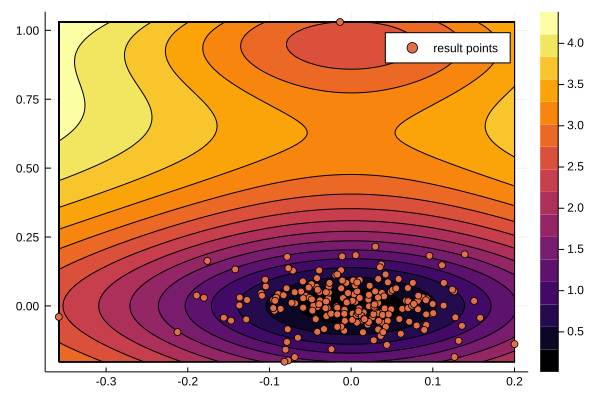

In [12]:
Random.seed!(1)
TestSimulatedAnnealing(200, Ackley, Ackley_2D, HyperRectangle([-20, -20], [40, 40]), 250)

## Random search around k-best points

### Helper structure: Cell (hyper-rectangle with a center and containing exactly k+1 sampled points)

In [13]:
using DataStructures;

struct FunctionEvaluation
    x # vector, argument of f
    y # f(x)
end;

mutable struct Cell
    center::FunctionEvaluation
    neighCount::Integer # number of calculated neighbours, current size of nearestNeighs
    maxNeighCount::Integer # number of neighbours, max size of nearestNeighs. Integer value >= 1
    nearestNeighs::PriorityQueue{FunctionEvaluation,Float64} # priority queue of nearest neighbours
    funValSum::Float64 # the sum of function values at the center and at the nearestNeighs
    funValSqSum::Float64 # the sum of function values squared
end;

function initCell(point::FunctionEvaluation, maxNeighCount::Integer)
    cell = Cell(point, 0, maxNeighCount, PriorityQueue{FunctionEvaluation, Float64}(Base.Order.Reverse), 0, 0)
    return cell;
end;

function LInfDist(x, y)
    return maximum(abs.(x-y))
end;

function updateNearestPoints!(cell::Cell, newPoint::FunctionEvaluation, distFun::Function)
    d = distFun(cell.center.x, newPoint.x)
    if (cell.neighCount < cell.maxNeighCount)
        enqueue!(cell.nearestNeighs, newPoint, d)
        cell.funValSum += newPoint.y
        cell.funValSqSum += newPoint.y^2
        cell.neighCount += 1;
    else
        currentFurthestElem = peek(cell.nearestNeighs)
        maxDist = currentFurthestElem[2]
        if (d < maxDist)
            removedPoint = dequeue!(cell.nearestNeighs)
            enqueue!(cell.nearestNeighs, newPoint, d)
            cell.funValSum += newPoint.y - removedPoint.y
            cell.funValSqSum += newPoint.y^2 - removedPoint.y^2
        end
    end;
end;

function getCellDiam(cell::Cell)
    if (cell.neighCount == cell.maxNeighCount)
        return peek(cell.nearestNeighs)[2]
    else
        return Inf
    end
end;

function calculateCellMeanAndSd(cell::Cell)
    N = cell.neighCount+1 # sample size, +1 for function value at the center
    mean = cell.funValSum / N
    sd = N > 1 ? sqrt((cell.funValSqSum - N * mean^2)/(N-1)) : Inf;
    return mean, sd
end;

In [14]:
using DataStructures;

function SampleFromPriorityQueue(pq::PriorityQueue)
    idx = rand(1:length(pq),1)[1]
    counter = 0
    for (cell, value) in pq
        counter += 1
        if (counter==idx)
            return cell
        end
    end
end

function AddNewFunctionEvaluation(qEval::Queue{FunctionEvaluation}, newEval::FunctionEvaluation,
    pqCell::PriorityQueue{Cell, Float64}, kBest::Integer, maxY_kBest::Float64, noPointsInSampleRect::Integer
)
    for (cell, value) in pqCell
        updateNearestPoints!(cell, newEval, LInfDist)
    end

    if (newEval.y < maxY_kBest) 
        cell = initCell(newEval, noPointsInSampleRect)
        for point in qEval
            updateNearestPoints!(cell, point, LInfDist)
        end
        enqueue!(pqCell, cell, newEval.y)
        while (length(pqCell)>kBest)
            dequeue_pair!(pqCell)
            maxY_kBest = peek(pqCell)[2]
        end
    end  
    return maxY_kBest
end;

function KBestNeighbourhoodSearch(f::Function, searchRect::HyperRectangle, evalCount::Integer; 
    #kBest::Integer=trunc(Int, sqrt(evalCount)), 
    #uniformSampleCount::Integer=trunc(Int, sqrt(evalCount)*3), 
    #noPointsInSampleRect::Integer=trunc(Int, sqrt(evalCount))
    kBest::Integer=10, # Integer, >= 1
    uniformSampleCount::Integer=trunc(Int, floor(sqrt(evalCount))),
    noPointsInSampleRect::Integer=floor(Int, uniformSampleCount/2)
)
    d = length(searchRect.a)
    l = searchRect.b - searchRect.a
    f01 = x -> f(searchRect.a + (l.*x)) # scale function to unit-hypercube

    qEval = Queue{FunctionEvaluation}()
    pqBestEval = PriorityQueue{Cell, Float64}(Base.Order.Reverse)
    maxY_kBest = Inf
    
    # first, sample uniformly uniformSampleCount points
    for i in 1:uniformSampleCount
        # new evaluation
        x = rand(d)
        newEval = FunctionEvaluation(x, f01(x))

        # update neighbourhood information for best cells and update best cells
        maxY_kBest = AddNewFunctionEvaluation(qEval, newEval, pqBestEval, kBest, 
            maxY_kBest, noPointsInSampleRect)  
        
        enqueue!(qEval, newEval)
    end
    
    # now, sample the rest of the points around the best points 
    for i in (uniformSampleCount+1):evalCount
        # new sample
        cell = SampleFromPriorityQueue(pqBestEval)
        diam = getCellDiam(cell)
        a = max.(0, cell.center.x .- diam)
        b = min.(1, cell.center.x .+ diam)
        x = a + (b-a).*rand(d)
        newEval = FunctionEvaluation(x, f01(x))

        # update neighbourhood information for best cells and update best cells
        maxY_kBest = AddNewFunctionEvaluation(qEval, newEval, pqBestEval, kBest, 
            maxY_kBest, noPointsInSampleRect)  
        
        enqueue!(qEval, newEval)
    end
        
    funEvals = Queue{FunctionEvaluation}()
    bestEval = first(qEval)
    bestValue = Inf
    for fun01Eval in qEval
        funEval = FunctionEvaluation(searchRect.a + l.*fun01Eval.x, fun01Eval.y)
        enqueue!(funEvals, funEval)
        if (funEval.y < bestValue)
            bestEval = funEval
        end
    end
    
    return bestEval, funEvals 
end;

In [15]:
function PlotKBestNeighbourSearch(f, f_2D, searchRect, evalCount) 
    
    bestEval, funEvals = KBestNeighbourhoodSearch(f, searchRect, evalCount);

    @printf("Best evaluation at [%.5f, %.5f] and equals %.5f", bestEval.x[1], bestEval.x[2], bestEval.y)
    
    x1 = collect(searchRect.a[1]:0.2:searchRect.b[1])
    x2 = collect(searchRect.a[2]:0.2:searchRect.b[2])
    c = contour(x1, x2, f_2D, fill=true)

    x1 = [eval.x[1] for eval in funEvals]
    x2 = [eval.x[2] for eval in funEvals]
    scatter!(c, x1, x2, label="iterate points")

    plot(c)
end

Random.seed!(1)
PlotKBestNeighbourSearch(Ackley, Ackley_2D, HyperRectangle([-20, -20], [40, 40]), 200)

Best evaluation at [0.33043, -0.27201] and equals 3.16019

In [16]:
function TestKBestNeighbourhoodSearch(testCount::Integer, 
    fun::Function, fun_2D::Function, searchRect::HyperRectangle, evalCount::Integer; 
    kBest::Integer=10, # Integer, >= 1
    uniformSampleCount::Integer=trunc(Int, floor(sqrt(evalCount))),
    noPointsInSampleRect::Integer=floor(Int, uniformSampleCount/2)
)
    qOpt = Queue{FunctionEvaluation}()
    for iter in 1:testCount
        bestEval, funEvals = KBestNeighbourhoodSearch(fun, HyperRectangle([-20,-20],[40,40]), evalCount)
        enqueue!(qOpt, bestEval)
    end

    x1 = [eval.x[1] for eval in qOpt]
    x2 = [eval.x[2] for eval in qOpt]

    a_min = [minimum(x1), minimum(x2)]
    b_min = [maximum(x1), maximum(x2)]
    delta_min = (b_min .- a_min) ./ 100

    x1_plot = collect(a_min[1]:delta_min[1]:b_min[1])
    x2_plot = collect(a_min[2]:delta_min[2]:b_min[2])
    c = contour(x1_plot, x2_plot, fun_2D, fill=true)

    scatter!(c, x1, x2, label="best points")

    plot(c)
end;

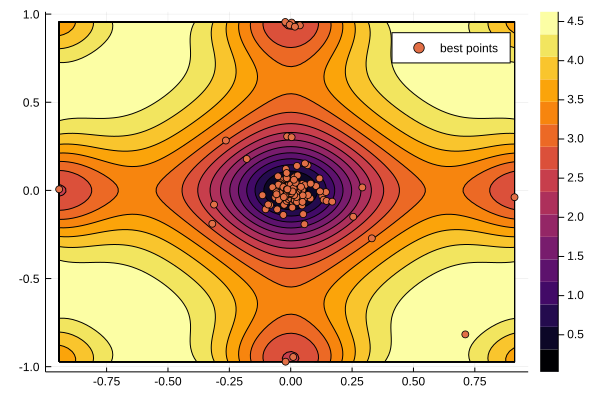

In [17]:
Random.seed!(1)
TestKBestNeighbourhoodSearch(200, Ackley, Ackley_2D, HyperRectangle([-20,-20],[40,40]), 200)

In the plot above, you can see the resuls of KBestNeighbourhoodSearch algoritm with 200 function evaluations (200 simulations [points])

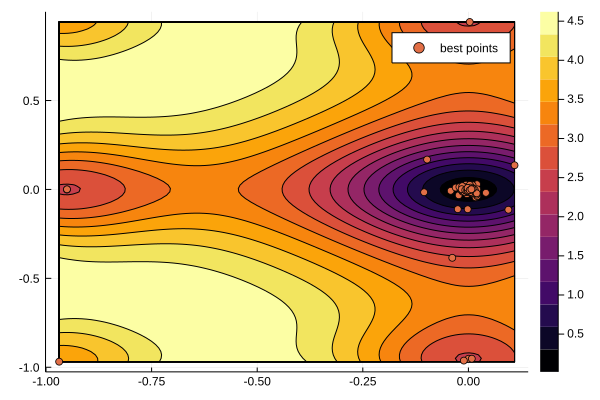

In [18]:
Random.seed!(1)
TestKBestNeighbourhoodSearch(200, Ackley, Ackley_2D, HyperRectangle([-20,-20],[40,40]), 250)

In the plot above, you can see the results of KBestNeighbourhoodSearch algoritm with 250 function evaluations (200 simulations [points])